1. Specify an ML model that can incorporate both image and text into Weaviate (an open-source vector database)
2. Add data to the vector database
3. Search the data with a text query
4. Search the data with an image query

In [17]:
!pip install weaviate-client==3.26.7

/opt/miniconda3/envs/my-env/lib/python3.12/pty.py:95: DeprecationWarning: This process (pid=72750) is multi-threaded, use of forkpty() may lead to deadlocks in the child.
  pid, fd = os.forkpty()
python(88651) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [18]:
import pickle, weaviate, json, os, IPython

In [19]:
!pip show weaviate-client

python(88661) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Name: weaviate-client
Version: 3.26.7
Summary: A python native Weaviate client
Home-page: https://github.com/weaviate/weaviate-python-client
Author: Weaviate
Author-email: hello@weaviate.io,
License: BSD 3-clause
Location: /opt/miniconda3/envs/my-env/lib/python3.12/site-packages
Requires: authlib, requests, validators
Required-by: 


In [21]:
from weaviate import EmbeddedOptions

/opt/miniconda3/envs/my-env/lib/python3.12/site-packages/weaviate/__init__.py:143: DeprecationWarning: Dep010: Importing EmbeddedOptions from weaviate is deprecated. Import EmbeddedOptions from its module: weaviate.embedded


### We first need to start a local instance of Weaviate using Docker.

<for MacOS>

0. to check that docker is actually runnning:
0a
if needed: cmd-space, then docker ..
0b
docker context 
.. the asterisk * should be next to default
0c
docker ps
.. and should see these:
CONTAINER ID   IMAGE     COMMAND   CREATED   STATUS    PORTS     NAMES

as needed, do these: 
killall Docker
killall com.docker.hyperkit
docker kill <container_name_or_id>

1. This can be done by opening up a terminal in the folder with the provided `docker-compose.yml` file in it and typing:
```bash
docker compose up
```

2. Later, in order to bring Weaviate down you can just go into this terminal window and type `Ctrl + C`

In [32]:
#Connect to locally hosted Weaviate and check if everything is ready
#client = weaviate.Client("http://localhost:8080") #this is for weaviate v3
client = weaviate.connect_to_local() #this is for the newer weaviate v4

print(f"Client created? {client.is_ready()}")

Client created? True


/opt/miniconda3/envs/my-env/lib/python3.12/site-packages/weaviate/warnings.py:302: ResourceWarning: Con004: The connection to Weaviate was not closed properly. This can lead to memory leaks.
            Please make sure to close the connection using `client.close()`.
/var/folders/01/mbqtydkj16z7_hxjc9fjwh2m0000gp/T/ipykernel_72750/1651881481.py:3: ResourceWarning: unclosed <socket.socket fd=73, family=30, type=1, proto=6, laddr=('::1', 60252, 0, 0), raddr=('::1', 8080, 0, 0)>
  client = weaviate.connect_to_local() #this is for the newer weaviate v4


### 1: Specify an ML model that can incorporate both image and text into Weaviate

In [34]:
#Delete the schema if it alredy exists
'''
if client.schema.exists("TextImageSearch"): #this is for v3
    client.schema.delete_class("TextImageSearch")
'''
if client.collections.exists("TextImageSearch"): #this is for the newer v4
    client.collections.delete_class("TextImageSearch")

In [39]:
# To do this we need to specify a schema in which we can specify the model to be used
# as well as the properties. 

''' #v3
class_obj = {
    'class':"TextImageSearch",
    'moduleConfig' :{
        'multi2vec-clip':{"imageFields":['image']}
    },
    
    'vectorizer': 'multi2vec-clip',
    
    'properties' : [{'name': "text", "dataType": ['string']},
                   {'name': 'image', "dataType": ['blob']}
                   ]
}

client.schema.create_class(class_obj) #v3
'''

#v4
from weaviate.classes.config import (
    Property, 
    DataType, 
    Configure, 
    Multi2VecField
)

# 1. Define the Vectorizer Configuration (replaces 'moduleConfig' and 'vectorizer' keys)
# multi2vec_clip is based on the original OpenAI CLIP (Contrastive Language-Image Pre-training) model, 
# which is designed to map both images and text into a shared vector space, 
# allowing for meaningful similarity comparisons across modalities. 
vectorizer_config = Configure.Vectorizer.multi2vec_clip(
    # Specify the image property to be vectorized by the module
    image_fields=[
        # In this simple case, we just point it to the 'image' property
        Multi2VecField(name="image")
    ]
)
# 2. Define the Properties (replaces the 'properties' list in v3 above)
properties_list = [
    # text property (vectorized by multi2vec-clip alongside the image)
    Property(name="text", data_type=DataType.TEXT),
    
    # image property (stores the base64 image data)
    Property(name="image", data_type=DataType.BLOB)
]

# 3. Create the Collection (replaces client.schema.create_class in v3 above)
client.collections.create(
    name="TextImageSearch", 
    properties=properties_list,
    vectorizer_config=vectorizer_config,
    # The v4 client automatically uses the 'multi2vec-clip' module based on the
    # vectorizer_config provided above.
)

print("Schema class created")

/opt/miniconda3/envs/my-env/lib/python3.12/site-packages/weaviate/warnings.py:196: DeprecationWarning: Dep024: You are using the `vectorizer_config` argument in `collection.config.create()`, which is deprecated.
            Use the `vector_config` argument instead.
            


Schema class created


### 2: Add data to the vector database

In [43]:
# Here we will pass in a larger dataset into a folder called "Images"
# this folder, and another one below, are NOT provided in this repo at this time

for img in os.listdir("Images/"):
    
    print(f"Adding image: {img}")
    
    encoded_image = weaviate.util.image_encoder_b64(f'Images/{img}')
    
    data_properties = {
        'image': encoded_image,
        'text' : img
    }
    
    #client.data_object.create(data_properties, class_name="TextImageSearch") #v3
    client.collections.get("TextImageSearch").data.insert(properties=data_properties) #v4
    
print("All images added!")

Adding image: Llama_LIL_134178.jpg
Adding image: Big Sur_ California_LIL_9678.jpg
Adding image: Cityscape_LIL_134155.jpg
Adding image: Spiral staircase_LIL_134156.jpg
Adding image: Cat_LIL_134138.jpg
Adding image: Microphone_LIL_134215.jpg
Adding image: On a grassy hill_LIL_134221.jpg
Adding image: Cherry_LIL_134126.jpg
Adding image: Joshua Tree and California coast_LIL_9670.jpg
Adding image: Onlookers contemplating_LIL_134225.jpg
Adding image: Deer_LIL_134180.jpg
Adding image: Wearing a white dress _LIL_134222.jpg
Adding image: Joshua Tree and California coast_LIL_9662.jpg
Adding image: Dog in motion_LIL_134175.jpg
Adding image: Conservatory_LIL_9680.jpg
Adding image: Cats on a chair_LIL_134151.jpg
Adding image: Pies and dishes_LIL_134217.jpg
Adding image: Golden Gate Bridge from Presidio_LIL_9682.jpg
Adding image: Bird feeder_LIL_134172.jpg
Adding image: Point Reyes_ California_LIL_9672.jpg
Adding image: Forest_LIL_134133.jpg
Adding image: Blue sky between skyscrapers_LIL_134160.jpg


### 3. Search the data with a text query

In [46]:
'''#v3
res = (
    client.query
    .get("TextImageSearch", ['text', '_additional {distance}'])
    .with_near_text({'concepts':['cute cats outdoors']})
    .with_limit(3)
    .do()
)
'''

#v4
from weaviate.classes.query import MetadataQuery

# 1. Get the Collection reference
text_image_collection = client.collections.get("TextImageSearch")

# 2. Execute the query using the .query.near_text() method
res = text_image_collection.query.near_text(
    # 3. Text concept to search for
    query="cute cats outdoors",
    
    # 4. Limit the number of results
    limit=3,
    
    # 5. Specify the properties to return
    return_properties=["text"],
    
    # 6. Request the distance metric using MetadataQuery
    return_metadata=MetadataQuery(distance=True)
)

#print(json.dumps(res,indent=2)) #v3

print("--- v4 Query Results ---")
for i, obj in enumerate(res.objects):
    # 'obj.properties' contains the requested fields (e.g., 'text')
    # 'obj.metadata' contains requested additions (e.g., 'distance')
    
    print(f"Result #{i+1}")
    print(f"  Text: {obj.properties.get('text')}")
    # Access the distance from the metadata attribute
    print(f"  Distance: {obj.metadata.distance if obj.metadata else 'N/A'}") 
    print("------------------------")

--- V4 Query Results ---
Result #1
  Text: Cats on a chair_LIL_134151.jpg
  Distance: 0.758930504322052
------------------------
Result #2
  Text: Cat_LIL_134138.jpg
  Distance: 0.7626053094863892
------------------------
Result #3
  Text: Bird feeder_LIL_134172.jpg
  Distance: 0.7971073985099792
------------------------


**Visualize some of the returned images:**

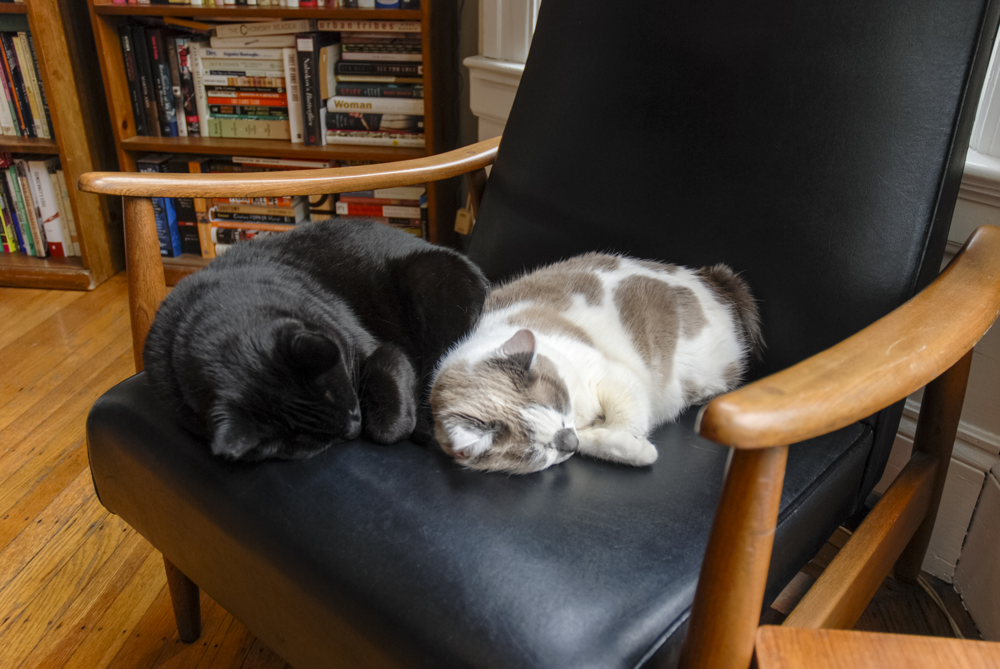

In [47]:
IPython.display.Image(filename='Images/Cats on a chair_LIL_134151.jpg', width=300)

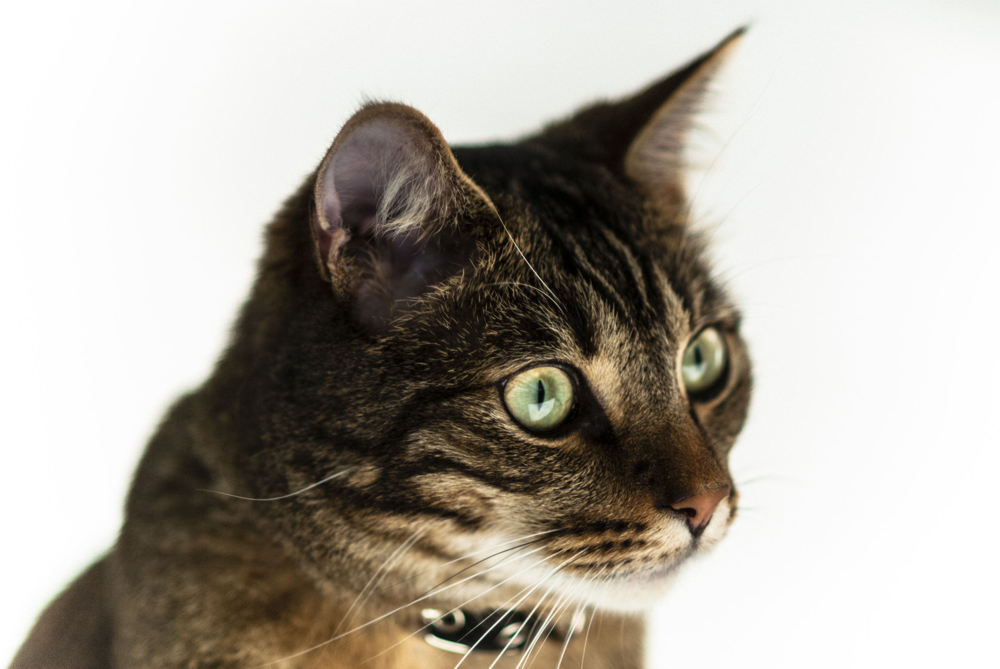

In [48]:
IPython.display.Image(filename='Images/Cat_LIL_134138.jpg', width=300)

### can (but not done below) perform more searches and see if one can explain why specific text search queries return certain images

#### Sucessfully used a vector database to build text-to-image search!

### 4. Search the data with an image query.

- **pass in images that are not in the vector database and search for the most similar images as determined by vector search** 

- **images used in the `TestImages` folder below are not provided here, feel free to provide your own images as search queries**

#### First visualize the image you want to query the database with:

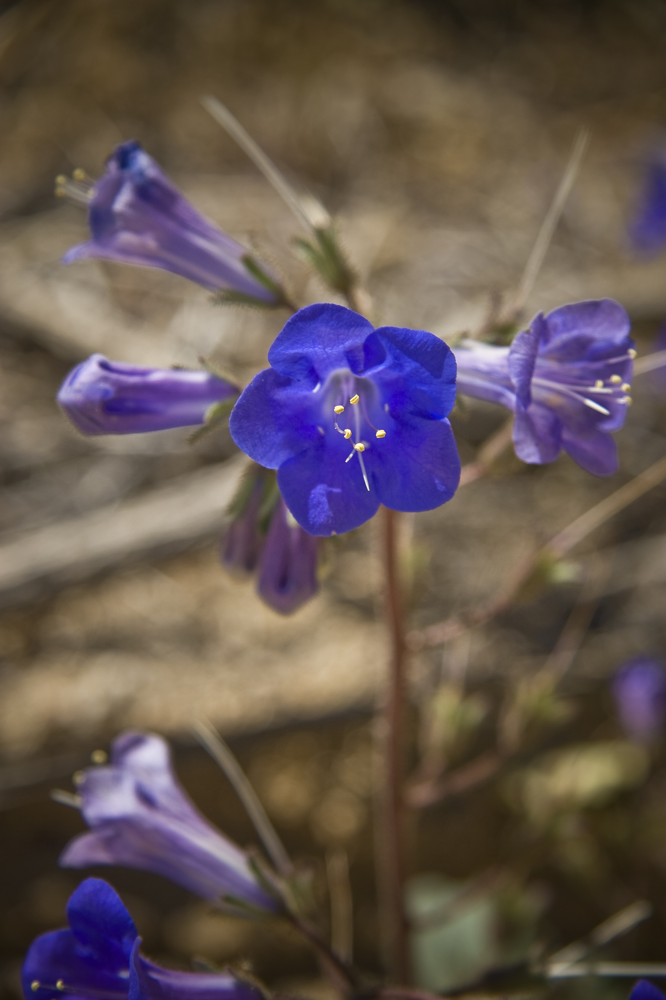

In [57]:
IPython.display.Image(filename='TestImages/Joshua Tree and California coast_LIL_9671.jpg', width=300) 

#### Now let's write a query to search using this image:

In [64]:
''' #v3
imres = (client.query
         .get('TextImageSearch', ['text', '_additional {distance}'])
         .with_near_image({'image' : 'TestImages/Joshua Tree and California coast_LIL_9671.jpg'})
         .with_limit(3)
         .do()
)

print(json.dumps(imres,indent=2))
'''

#v4
import base64
#from weaviate.classes.query import NearImageQuery, MetadataQuery
IMAGE_FILE_PATH = 'TestImages/Joshua Tree and California coast_LIL_9671.jpg'
COLLECTION_NAME = 'TextImageSearch'

# --- V4 Step 1: Read and Encode the Image File ---
try:
    with open(IMAGE_FILE_PATH, "rb") as image_file:
        base64_image = base64.b64encode(image_file.read()).decode("utf-8")
except FileNotFoundError:
    print(f"Error: Image file not found at {IMAGE_FILE_PATH}")
    base64_image = None
    
imres = client.collections.get(COLLECTION_NAME).query.near_image(
    near_image=base64_image, 
    limit=3,
    return_properties=["text"],
    return_metadata=MetadataQuery(distance=True)
)

for i, obj in enumerate(imres.objects):
        # obj.properties is a dict of the requested fields
        text_content = obj.properties.get('text', 'N/A')
        
        # obj.metadata contains the requested distance
        distance = obj.metadata.distance if obj.metadata else 'N/A'
        
        print(f"Result #{i+1}")
        print(f"  Text: {text_content}")
        print(f"  Distance: {distance}")
        print("-------------------------------")

Result #1
  Text: Joshua Tree and California coast_LIL_9670.jpg
  Distance: 0.18637114763259888
-------------------------------
Result #2
  Text: Joshua Tree and California coast_LIL_9662.jpg
  Distance: 0.19507181644439697
-------------------------------
Result #3
  Text: Cherry_LIL_134126.jpg
  Distance: 0.2964158058166504
-------------------------------


**Visualize the images most similar to the input image**

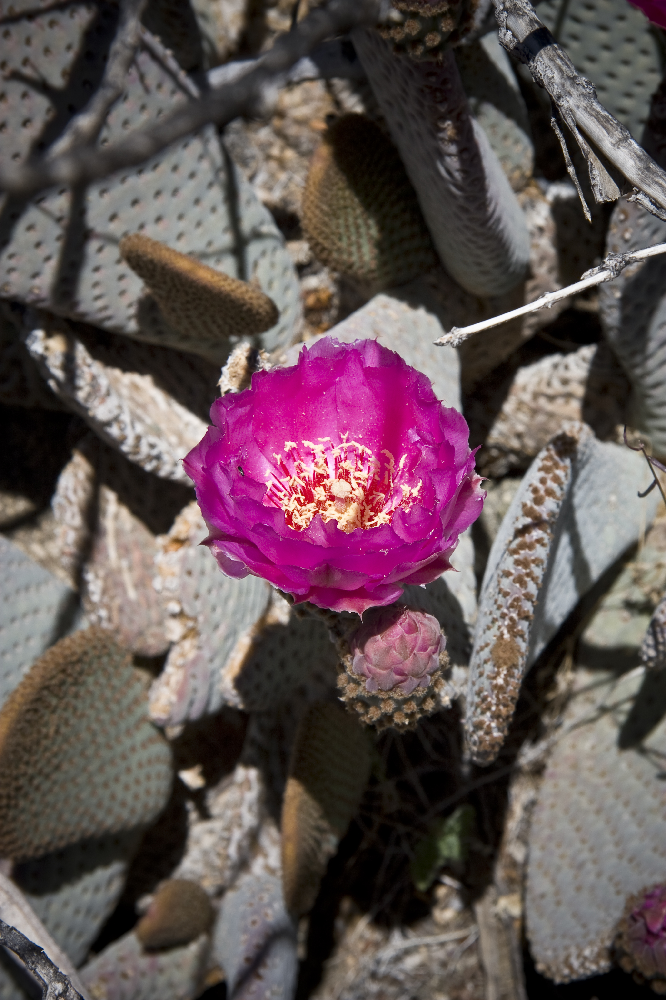

In [65]:
IPython.display.Image(filename='Images/Joshua Tree and California coast_LIL_9670.jpg', width=300)

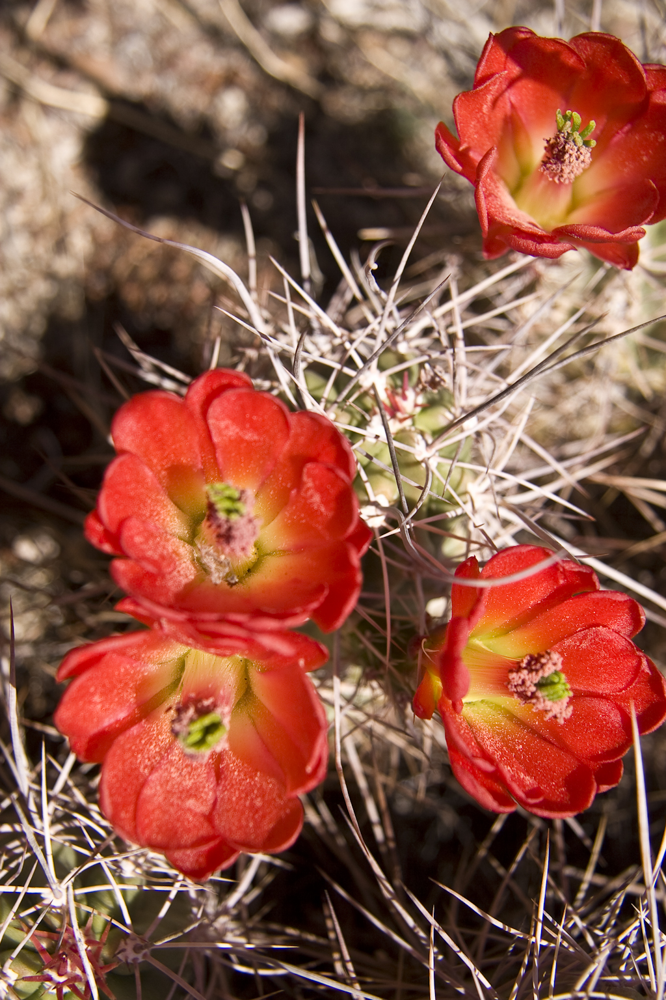

In [66]:
IPython.display.Image(filename='Images/Joshua Tree and California coast_LIL_9662.jpg', width=300)